In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geopy-2.0.0                |     pyh9f0ad1d_0          63 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    certifi-2020.6.20          |   py36h9f0ad1d_0         151 KB  conda-forge
    openssl-1.1.1g             |       h516909a_1         2.1 MB  conda-forge
    ca-certificates-2020.6.20  |       hecda079_0         145 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0          conda-forge
    geopy:           

In [2]:
df = pd.read_json (r'https://data.cityofnewyork.us/resource/f7b6-v6v3.json')
df.to_csv (r'Desktop\cityofnewyork.csv', index = None)

In [3]:
df.head()


,:@computed_region_92fq_4b7q,:@computed_region_efsh_h5xi,:@computed_region_f5dn_yrer,:@computed_region_sbqj_enih,:@computed_region_yeji_bk3q,bbl,bin,borough,census_tract,community_board,council_district,cross_streets,facility_name,facility_type,latitude,location_1,longitude,nta,phone,postcode
0,45,18184,21,35,2,3.069900e+09,3188417.0,Brooklyn,348.0,13.0,47.0,W. 22nd St. & W. 23rd St.,Ida G. Israel Community Health Center,Child Health Center,40.578468,"{'latitude': '40.578488319967', 'longitude': '...",-73.989614,Seagate-Coney Island ...,718-946-3400,11224.0
1,46,24669,41,71,3,4.122000e+09,4264631.0,Queens,276.0,12.0,28.0,NaN,South Queens Community Health Center,Child Health Center,40.688615,"{'latitude': '40.676945262114', 'longitude': '...",-73.785593,Baisley Park ...,718-883-6699,11434.0
2,43,10929,49,23,5,NaN,NaN,Bronx,NaN,NaN,NaN,between Morris Ave. & Courtlandt Ave.,Melrose Houses Child Health Clinic,Child Health Center,NaN,"{'latitude': '40.821301194646', 'longitude': '...",NaN,NaN,718-292-2820,NaN
3,42,10934,34,25,5,NaN,NaN,Bronx,NaN,NaN,NaN,corner of Webster Ave.,Daniel Webster Houses Child Health Clinic,Child Health Center,NaN,"{'latitude': '40.832279848967', 'longitude': '...",NaN,NaN,718-538-2147,NaN
4,35,10932,49,23,5,NaN,NaN,Bronx,NaN,NaN,NaN,NaN,Segundo Ruiz Belvis Diagnostic & Treatment Center,Diagnostic & Treatment Center,NaN,"{'latitude': '40.810121864043', 'longitude': '...",NaN,NaN,718-579-4000,NaN


In [4]:
df.drop([":@computed_region_92fq_4b7q",":@computed_region_efsh_h5xi",":@computed_region_f5dn_yrer",":@computed_region_sbqj_enih",":@computed_region_yeji_bk3q","bbl","bin","census_tract","community_board","council_district","cross_streets","nta","phone"], axis=1)

,borough,facility_name,facility_type,latitude,location_1,longitude,postcode
0,Brooklyn,Ida G. Israel Community Health Center,Child Health Center,40.578468,"{'latitude': '40.578488319967', 'longitude': '...",-73.989614,11224.0
1,Queens,South Queens Community Health Center,Child Health Center,40.688615,"{'latitude': '40.676945262114', 'longitude': '...",-73.785593,11434.0
2,Bronx,Melrose Houses Child Health Clinic,Child Health Center,NaN,"{'latitude': '40.821301194646', 'longitude': '...",NaN,NaN
3,Bronx,Daniel Webster Houses Child Health Clinic,Child Health Center,NaN,"{'latitude': '40.832279848967', 'longitude': '...",NaN,NaN
4,Bronx,Segundo Ruiz Belvis Diagnostic & Treatment Center,Diagnostic & Treatment Center,NaN,"{'latitude': '40.810121864043', 'longitude': '...",NaN,NaN
5,Queens,Parsons Communicare Clinic,Child Health Center,40.703826,"{'latitude': '40.71311535449', 'longitude': '-...",-73.800483,11432.0
6,Queens,Queens Hospital Center,Child Health Center,40.717250,"{'latitude': '40.71311535449', 'longitude': '-...",-73.803433,11432.0
7,Queens,Elmhurst Hospital Center,Acute Care Hospital,NaN,"{'latitude': '40.738710402563', 'longitude': '...",NaN,NaN
8,Brooklyn,Cumberland Diagnostic & Treatment Center,Child Health Center,NaN,"{'latitude': '40.695143584665', 'longitude': '...",NaN,NaN
9,Queens,Junction Boulevard Child Health Clinic,Child Health Center,40.754179,"{'latitude': '40.751630739367', 'longitude': '...",-73.872231,11372.0


In [5]:
df.dropna( subset=["latitude","longitude"], inplace=True)
df.head()

,:@computed_region_92fq_4b7q,:@computed_region_efsh_h5xi,:@computed_region_f5dn_yrer,:@computed_region_sbqj_enih,:@computed_region_yeji_bk3q,bbl,bin,borough,census_tract,community_board,council_district,cross_streets,facility_name,facility_type,latitude,location_1,longitude,nta,phone,postcode
0,45,18184,21,35,2,3.069900e+09,3188417.0,Brooklyn,348.0,13.0,47.0,W. 22nd St. & W. 23rd St.,Ida G. Israel Community Health Center,Child Health Center,40.578468,"{'latitude': '40.578488319967', 'longitude': '...",-73.989614,Seagate-Coney Island ...,718-946-3400,11224.0
1,46,24669,41,71,3,4.122000e+09,4264631.0,Queens,276.0,12.0,28.0,NaN,South Queens Community Health Center,Child Health Center,40.688615,"{'latitude': '40.676945262114', 'longitude': '...",-73.785593,Baisley Park ...,718-883-6699,11434.0
5,24,24340,25,65,3,4.097560e+09,4208836.0,Queens,44601.0,12.0,24.0,between Jamaica Ave. & 90th Ave.,Parsons Communicare Clinic,Child Health Center,40.703826,"{'latitude': '40.71311535449', 'longitude': '-...",-73.800483,Jamaica ...,718-334-6401,11432.0
6,24,24340,25,65,3,4.068580e+09,4442431.0,Queens,1267.0,8.0,24.0,NaN,Queens Hospital Center,Child Health Center,40.717250,"{'latitude': '40.71311535449', 'longitude': '-...",-73.803433,Pomonok-Flushing Heights-Hillcrest ...,718-883-3000,11432.0
9,5,14783,65,73,3,4.017290e+09,4042887.0,Queens,375.0,3.0,21.0,between 34th Ave. & 35th Ave.,Junction Boulevard Child Health Clinic,Child Health Center,40.754179,"{'latitude': '40.751630739367', 'longitude': '...",-73.872231,North Corona ...,718-334-6150,11372.0


In [6]:
df2=df.drop([":@computed_region_92fq_4b7q",":@computed_region_efsh_h5xi",":@computed_region_f5dn_yrer",":@computed_region_sbqj_enih",":@computed_region_yeji_bk3q","bbl","bin","census_tract","community_board","council_district","cross_streets","nta","phone","location_1"], axis=1)

In [7]:
df2.head()


,borough,facility_name,facility_type,latitude,longitude,postcode
0,Brooklyn,Ida G. Israel Community Health Center,Child Health Center,40.578468,-73.989614,11224.0
1,Queens,South Queens Community Health Center,Child Health Center,40.688615,-73.785593,11434.0
5,Queens,Parsons Communicare Clinic,Child Health Center,40.703826,-73.800483,11432.0
6,Queens,Queens Hospital Center,Child Health Center,40.717250,-73.803433,11432.0
9,Queens,Junction Boulevard Child Health Clinic,Child Health Center,40.754179,-73.872231,11372.0


In [8]:
df2.dtypes


borough           object
facility_name     object
facility_type     object
latitude         float64
longitude        float64
postcode         float64
dtype: object

In [9]:
df2.shape


(60, 6)

In [10]:
facilityName= df['facility_name']
facilityName

0                 Ida G. Israel Community Health Center
1                  South Queens Community Health Center
5                            Parsons Communicare Clinic
6                                Queens Hospital Center
9                Junction Boulevard Child Health Clinic
10            Woodhull Medical and Mental Health Center
11         Eleanor Roosevelt Houses Child Health Clinic
12                                Jacobi Medical Center
13                         Metropolitan Hospital Center
14                                 Bushwick Communicare
15                 Lafayette Houses Child Health Clinic
16          East New York Diagnostic & Treatment Center
17                     Williamsburg Child Health Clinic
18                         North Central Bronx Hospital
19                               Harlem Hospital Center
21    Dr. Susan Smith McKinney Nursing and Rehabilit...
23                           Corona Child Health Clinic
24       Sea View Hospital Rehabilitation Center

In [11]:
address = 'New York City, NY'
geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [12]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)
    
def plotDot(point):
    folium.CircleMarker(location=[point.latitude, point.longitude], radius=2, weight=5).add_to(map_newyork)
    
df2.apply(plotDot, axis=1)

map_newyork.fit_bounds(map_newyork.get_bounds())

map_newyork

In [13]:
import folium.plugins
folium.plugins.MarkerCluster()

In [14]:
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, facility in zip(df2['latitude'], df2['longitude'], df2['borough'], df2['facility_name']):
    label = '{}, {}'.format(facility, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [15]:
CLIENT_ID = '5QEI51BA5O5NLE5PV0UYXL0N04HORM2YYFROOXXTGLHSQZUX' # your Foursquare ID
CLIENT_SECRET = 'AIJSLZ2GBZACFSWMOJWPMAYXVC5HSRZLTSY53JLZ4BCRT33Y' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 5QEI51BA5O5NLE5PV0UYXL0N04HORM2YYFROOXXTGLHSQZUX
CLIENT_SECRET:AIJSLZ2GBZACFSWMOJWPMAYXVC5HSRZLTSY53JLZ4BCRT33Y


In [16]:
df2.loc[0, 'facility_name']

'Ida G. Israel Community Health Center'

In [17]:
LIMIT = 50 
radius = 200 

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=5QEI51BA5O5NLE5PV0UYXL0N04HORM2YYFROOXXTGLHSQZUX&client_secret=AIJSLZ2GBZACFSWMOJWPMAYXVC5HSRZLTSY53JLZ4BCRT33Y&v=20180605&ll=40.7127281,-74.0060152&radius=200&limit=50'

In [18]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f357158c9c6b914fda7fefa'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Downtown Manhattan',
  'headerFullLocation': 'Downtown Manhattan, New York',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 18,
  'suggestedBounds': {'ne': {'lat': 40.7145281018, 'lng': -74.00364492825368},
   'sw': {'lat': 40.7109280982, 'lng': -74.00838547174631}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '57f0689d498e7d49d9189369',
       'name': 'The Bar Room at Temple Court',
       'location': {'address': '123 Nassau St',
        'lat': 40.7114477287544,
        'lng': -74.00680157032005,
        'labeledLatLngs': [{'label': 'display',
     

In [19]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [20]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues

,name,categories,lat,lng
0,The Bar Room at Temple Court,Hotel Bar,40.711448,-74.006802
1,Alba Dry Cleaner & Tailor,Laundry Service,40.711434,-74.006272
2,"The Beekman, A Thompson Hotel",Hotel,40.711173,-74.006702
3,City Hall Park,Park,40.712415,-74.006724
4,Gibney Dance Center Downtown,Dance Studio,40.713923,-74.005661
5,Aahar Indian Cuisine,Indian Restaurant,40.713307,-74.007994
6,Woolworth Building,Building,40.712559,-74.007964
7,Barnes & Noble,Bookstore,40.711914,-74.006145
8,Wafels & Dinges - Pagadder Cart,Dessert Shop,40.712586,-74.004952
9,The Helena Gym,Gym,40.714276,-74.005967


In [21]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

18 venues were returned by Foursquare.


In [22]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['facility_name', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [23]:
nyc_venues_healthcare = getNearbyVenues(names=df2['facility_name'],
                                   latitudes=df2['latitude'],
                                   longitudes=df2['longitude']
                                  )

Ida G. Israel Community Health Center
South Queens Community Health Center
Parsons Communicare Clinic
Queens Hospital Center
Junction Boulevard Child Health Clinic
Woodhull Medical and Mental Health Center
Eleanor Roosevelt Houses Child Health Clinic
Jacobi Medical Center
Metropolitan Hospital Center
Bushwick Communicare
Lafayette Houses Child Health Clinic
East New York Diagnostic & Treatment Center
Williamsburg Child Health Clinic
North Central Bronx Hospital
Harlem Hospital Center
Dr. Susan Smith McKinney Nursing and Rehabilitation Center
Corona Child Health Clinic
Sea View Hospital Rehabilitation Center & Home
Springfield Gardens Medical Center
Morrisania Diagnostic & Treatment Center
Jacobi Medical Center
Kings County Hospital Center
Coler-Goldwater Specialty Hospital and Nursing Facility/Coler Campus
Kings County Hospital Center
Bellevue Hospital Center
Jonathan Williams Houses Child Health Clinic
Grant Houses Clinic
Dyckman Clinica De Las Americas
East New York Diagnostic & Trea

In [24]:
nyc_venues_healthcare.head()

,facility_name,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Ida G. Israel Community Health Center,40.578468,-73.989614,Best Buy Liquors,40.579284,-73.984699,Liquor Store
1,Ida G. Israel Community Health Center,40.578468,-73.989614,Totonno's Pizzeria Napolitano,40.579037,-73.983970,Pizza Place
2,Ida G. Israel Community Health Center,40.578468,-73.989614,Starbucks,40.581229,-73.985451,Coffee Shop
3,Ida G. Israel Community Health Center,40.578468,-73.989614,Shell Gas Station,40.580226,-73.985920,Gas Station
4,Ida G. Israel Community Health Center,40.578468,-73.989614,Kennedy Fried Chicken & Pizza,40.576163,-73.990963,Fried Chicken Joint


In [25]:
nyc_venues_healthcare.shape

(1801, 7)

In [26]:
nyc_venues_healthcare.groupby('facility_name').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
facility_name,,,,,,
Baruch Houses Family Health Center,29,29,29,29,29,29
Bellevue Hospital Center,96,96,96,96,96,96
Brownsville Child Health Clinic,18,18,18,18,18,18
Bushwick Communicare,17,17,17,17,17,17
Bushwick Community Health Center,36,36,36,36,36,36
Coler-Goldwater Specialty Hospital and Nursing Facility/Coler Campus,19,19,19,19,19,19
Coler-Goldwater Specialty Hospital and Nursing Facility/Goldwater Campus,28,28,28,28,28,28
Coney Island Hospital,10,10,10,10,10,10
Corona Child Health Clinic,21,21,21,21,21,21


In [27]:
print('There are {} uniques categories.'.format(len(nyc_venues_healthcare['Venue Category'].unique())))


There are 241 uniques categories.


In [28]:
nyc_venues_healthcare_onehot = pd.get_dummies(nyc_venues_healthcare[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_venues_healthcare_onehot['facility_name'] = nyc_venues_healthcare['facility_name'] 

# move neighborhood column to the first column
fixed_columns = [nyc_venues_healthcare_onehot.columns[-1]] + list(nyc_venues_healthcare_onehot.columns[:-1])
nyc_venues_healthcare_onehot = nyc_venues_healthcare_onehot[fixed_columns]

nyc_venues_healthcare_onehot.head

<bound method NDFrame.head of                                           facility_name  Adult Boutique  \
0                 Ida G. Israel Community Health Center               0   
1                 Ida G. Israel Community Health Center               0   
2                 Ida G. Israel Community Health Center               0   
3                 Ida G. Israel Community Health Center               0   
4                 Ida G. Israel Community Health Center               0   
5                 Ida G. Israel Community Health Center               0   
6                 Ida G. Israel Community Health Center               0   
7                 Ida G. Israel Community Health Center               0   
8                 Ida G. Israel Community Health Center               0   
9                 Ida G. Israel Community Health Center               0   
10                Ida G. Israel Community Health Center               0   
11                Ida G. Israel Community Health Center               

In [29]:
nyc_venues_healthcare_onehot.shape

(1801, 242)

In [30]:
nyc_venues_healthcare_grouped = nyc_venues_healthcare_onehot.groupby('facility_name').mean().reset_index()
nyc_venues_healthcare_grouped

,facility_name,Adult Boutique,African Restaurant,American Restaurant,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Trail,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Theater,Comedy Club,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Himalayan Restaurant,Historic Site,History Museum,Home Service,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Library,Lighthouse,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Noodle House,Optical Shop,Organic Grocery,Other Great Outdoors,Paper / Office Supplies Store,Park,Peking Duck Restaurant,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Piercing Parlor,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Post Office,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Track,Trail,Tram Station,Vape Store,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,Baruch Houses Family Health Center,0.00,0.000000,0.000000,0.00,0.00,0.103448,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.034483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.034483,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.034483,0.000000,0.034483,0.000000,0.034483,0.00,0.000000,0.000000,0.00,0.068966,0.00,0.000000,0.000000,0.000000,0.034483,0.000000,0.000000,0.000000,0.000000,0.

In [31]:
nyc_venues_healthcare_grouped.shape

(48, 242)

In [32]:
num_top_venues = 5

for hood in nyc_venues_healthcare_grouped['facility_name']:
    print("----"+hood+"----")
    temp = nyc_venues_healthcare_grouped[nyc_venues_healthcare_grouped['facility_name'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Baruch Houses Family Health Center----
                venue  freq
0                Park  0.10
1         Art Gallery  0.10
2  Chinese Restaurant  0.07
3            Pharmacy  0.07
4         Yoga Studio  0.03


----Bellevue Hospital Center----
                 venue  freq
0                  Bar  0.08
1           Bagel Shop  0.06
2  American Restaurant  0.06
3   Italian Restaurant  0.04
4       Ice Cream Shop  0.04


----Brownsville Child Health Clinic----
                 venue  freq
0           Restaurant  0.11
1  Fried Chicken Joint  0.11
2       Discount Store  0.06
3    Convenience Store  0.06
4   Spanish Restaurant  0.06


----Bushwick Communicare----
                  venue  freq
0                  Café  0.12
1         Deli / Bodega  0.12
2  Fast Food Restaurant  0.06
3            Vape Store  0.06
4         Burrito Place  0.06


----Bushwick Community Health Center----
                venue  freq
0       Deli / Bodega  0.14
1  Mexican Restaurant  0.08
2  Chinese Restaurant  0.0

In [33]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [34]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['facility_name']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['facility_name'] = nyc_venues_healthcare_grouped['facility_name']

for ind in np.arange(nyc_venues_healthcare_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(nyc_venues_healthcare_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,facility_name,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Baruch Houses Family Health Center,Art Gallery,Park,Pharmacy,Chinese Restaurant,Playground,Diner,Pizza Place,Dance Studio,Coffee Shop,Tennis Court
1,Bellevue Hospital Center,Bar,American Restaurant,Bagel Shop,Grocery Store,Ice Cream Shop,Italian Restaurant,Coffee Shop,Pizza Place,Yoga Studio,Playground
2,Brownsville Child Health Clinic,Restaurant,Fried Chicken Joint,Pool,Trail,Convenience Store,Performing Arts Venue,Discount Store,Park,Chinese Restaurant,Shoe Store
3,Bushwick Communicare,Deli / Bodega,Café,Vape Store,Frozen Yogurt Shop,Supermarket,Fast Food Restaurant,Cocktail Bar,Coffee Shop,Latin American Restaurant,Restaurant
4,Bushwick Community Health Center,Deli / Bodega,Mexican Restaurant,Pizza Place,Playground,Spa,Chinese Restaurant,Shoe Store,Cosmetics Shop,Cocktail Bar,Sandwich Place


In [35]:
df3=nyc_venues_healthcare_grouped.drop("facility_name", axis=1)
import seaborn as sns
import matplotlib.pyplot as plt
scores=[KMeans(n_clusters=i+2).fit(df3).inertia_
       for i in range(10)]
sns.lineplot(np.arange(2,12), scores)

plt.xlabel('number of clusters')
plt.ylabel("inertia")
plt.title("Inertia of K-means vs number of clusters")


Text(0.5, 1.0, 'Inertia of K-means vs number of clusters')

In [36]:
kclusters = 5

nyc_venues_healthcare_grouped_clustering = df3

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(nyc_venues_healthcare_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([4, 0, 0, 4, 4, 1, 1, 2, 4, 0], dtype=int32)

In [37]:
nyc_venues_healthcare_grouped_clustering['Cluster Labels'] = kmeans.labels_
nyc_venues_healthcare_grouped_clustering.head()

,Adult Boutique,African Restaurant,American Restaurant,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Trail,Bookstore,Boutique,Boxing Gym,Breakfast Spot,Brewery,Bubble Tea Shop,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cantonese Restaurant,Caribbean Restaurant,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Theater,Comedy Club,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Himalayan Restaurant,Historic Site,History Museum,Home Service,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Library,Lighthouse,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts School,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Noodle House,Optical Shop,Organic Grocery,Other Great Outdoors,Paper / Office Supplies Store,Park,Peking Duck Restaurant,Performing Arts Venue,Peruvian Restaurant,Pet Store,Pharmacy,Piercing Parlor,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Post Office,Pub,Public Art,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Steakhouse,Supermarket,Supplement Shop,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Toy / Game Store,Track,Trail,Tram Station,Vape Store,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Cluster Labels
0,0.0,0.0,0.0000,0.0,0.0,0.103448,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0000,0.034483,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.034483,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.034483,0.0,0.034483,0.0,0.034483,0.0,0.0,0.0,0.0,0.068966,0.0,0.0,0.0,0.000000,0.034483,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.034483,0.000000,0.0,0.0,0.0,0.034483,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.

In [38]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
nyc_merged = df2

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
nyc_merged = nyc_merged.join(neighborhoods_venues_sorted.set_index('facility_name'), on='facility_name')

nyc_merged

,borough,facility_name,facility_type,latitude,longitude,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Brooklyn,Ida G. Israel Community Health Center,Child Health Center,40.578468,-73.989614,11224.0,4,Pizza Place,Smoke Shop,Fast Food Restaurant,Deli / Bodega,Gas Station,Fried Chicken Joint,Cosmetics Shop,Pharmacy,Liquor Store,Bakery
1,Queens,South Queens Community Health Center,Child Health Center,40.688615,-73.785593,11434.0,0,Lawyer,Wine Shop,Hotel,Bus Station,Bus Stop,Southern / Soul Food Restaurant,BBQ Joint,Electronics Store,Field,Farmers Market
5,Queens,Parsons Communicare Clinic,Child Health Center,40.703826,-73.800483,11432.0,0,Mobile Phone Shop,Clothing Store,Mexican Restaurant,Coffee Shop,Bank,Pizza Place,Caribbean Restaurant,Supplement Shop,Sri Lankan Restaurant,Fried Chicken Joint
6,Queens,Queens Hospital Center,Child Health Center,40.717250,-73.803433,11432.0,4,Pizza Place,Ice Cream Shop,Chinese Restaurant,Bakery,Filipino Restaurant,Bus Line,Fast Food Restaurant,Nail Salon,Coffee Shop,Sushi Restaurant
9,Queens,Junction Boulevard Child Health Clinic,Child Health Center,40.754179,-73.872231,11372.0,4,Fast Food Restaurant,Pizza Place,Bank,South American Restaurant,Gas Station,Pharmacy,Donut Shop,Chinese Restaurant,Salvadoran Restaurant,Sandwich Place
10,Brooklyn,Woodhull Medical and Mental Health Center,Child Health Center,40.700528,-73.941604,11206.0,0,Pizza Place,Bakery,Mexican Restaurant,Music Venue,Spanish Restaurant,Bus Station,Café,Farmers Market,Farm,Bike Rental / Bike Share
11,Brooklyn,Eleanor Roosevelt Houses Child Health Clinic,Child Health Center,40.694049,-73.934552,11206.0,0,Bar,Café,Pizza Place,Music Venue,Deli / Bodega,Bakery,Asian Restaurant,Liquor Store,Spanish Restaurant,Discount Store
12,Bronx,Jacobi Medical Center,Acute Care Hospital,40.857427,-73.847079,10461.0,3,Bus Station,Bar,Gym,Bakery,Yoga Studio,Food Court,Food & Drink Shop,Food,Flower Shop,Fish Market
13,Manhattan,Metropolitan Hospital Center,Acute Care Hospital,40.784557,-73.943780,10029.0,4,Pizza Place,Coffee Shop,Fast Food Restaurant,Thai Restaurant,Pharmacy,Bank,Gym,Chinese Restaurant,Cocktail Bar,Donut Shop
14,Brooklyn,Bushwick Communicare,Child Health Center,40.694674,-73.919153,11221.0,4,Deli / Bodega,Café,Vape Store,Frozen Yogurt Shop,Supermarket,Fast Food Restaurant,Cocktail Bar,Coffee Shop,Latin American Restaurant,Restaurant


In [39]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(nyc_merged['latitude'], nyc_merged['longitude'], nyc_merged['facility_name'], nyc_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [40]:
#cluter 0
cluster1=nyc_merged.loc[nyc_merged['Cluster Labels'] == 0, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]
cluster1.head()

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,South Queens Community Health Center,11434.0,0,Lawyer,Wine Shop,Hotel,Bus Station,Bus Stop,Southern / Soul Food Restaurant,BBQ Joint,Electronics Store,Field,Farmers Market
5,Parsons Communicare Clinic,11432.0,0,Mobile Phone Shop,Clothing Store,Mexican Restaurant,Coffee Shop,Bank,Pizza Place,Caribbean Restaurant,Supplement Shop,Sri Lankan Restaurant,Fried Chicken Joint
10,Woodhull Medical and Mental Health Center,11206.0,0,Pizza Place,Bakery,Mexican Restaurant,Music Venue,Spanish Restaurant,Bus Station,Café,Farmers Market,Farm,Bike Rental / Bike Share
11,Eleanor Roosevelt Houses Child Health Clinic,11206.0,0,Bar,Café,Pizza Place,Music Venue,Deli / Bodega,Bakery,Asian Restaurant,Liquor Store,Spanish Restaurant,Discount Store
15,Lafayette Houses Child Health Clinic,11205.0,0,Pizza Place,Bar,Wine Shop,Coffee Shop,Cocktail Bar,Garden,Yoga Studio,Diner,Southern / Soul Food Restaurant,Filipino Restaurant


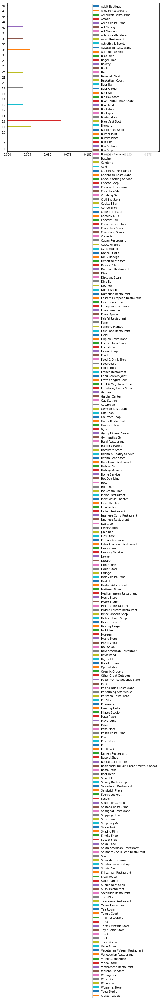

In [41]:
df_0 = nyc_venues_healthcare_grouped_clustering[nyc_venues_healthcare_grouped_clustering['Cluster Labels'] == 0]
df_0.plot.barh(figsize=(10, 10))

In [43]:
#cluster 1
cluster2=nyc_merged.loc[nyc_merged['Cluster Labels'] == 1, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]
cluster2.head()

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
24,Sea View Hospital Rehabilitation Center & Home,10314.0,1,Moving Target,Historic Site,Baseball Field,Gym,Liquor Store,Theater,Fish Market,Fish & Chips Shop,Filipino Restaurant,Event Space
34,Coler-Goldwater Specialty Hospital and Nursing...,10044.0,1,Liquor Store,Park,Tennis Court,Track,Food Court,Café,Sculpture Garden,Garden,Lighthouse,Farmers Market
58,Coler-Goldwater Specialty Hospital and Nursing...,10044.0,1,Park,Tennis Court,Historic Site,Playground,Plaza,Dog Run,Coffee Shop,Roof Deck,Scenic Lookout,Café


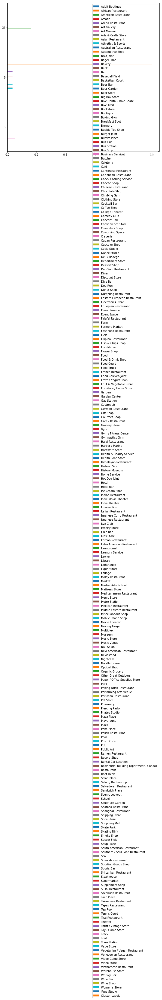

In [44]:
df_1 = nyc_venues_healthcare_grouped_clustering[nyc_venues_healthcare_grouped_clustering['Cluster Labels'] == 1]
df_1.plot.barh(figsize=(10, 10))

In [45]:
#cluster 2
nyc_merged.loc[nyc_merged['Cluster Labels'] == 2, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
43,Coney Island Hospital,11235.0,2,Eastern European Restaurant,Japanese Restaurant,Supermarket,Convenience Store,Yoga Studio,Filipino Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field
65,Coney Island Hospital,11235.0,2,Eastern European Restaurant,Japanese Restaurant,Supermarket,Convenience Store,Yoga Studio,Filipino Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field


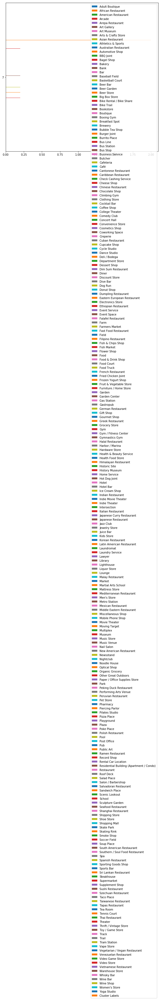

In [45]:
df_2 = nyc_venues_healthcare_grouped_clustering[nyc_venues_healthcare_grouped_clustering['Cluster Labels'] == 2]
df_2.plot.barh(figsize=(10, 10))

In [46]:
#cluster 3
nyc_merged.loc[nyc_merged['Cluster Labels'] == 3, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,Jacobi Medical Center,10461.0,3,Bus Station,Bar,Gym,Bakery,Yoga Studio,Food Court,Food & Drink Shop,Food,Flower Shop,Fish Market
30,Jacobi Medical Center,10461.0,3,Bus Station,Bar,Gym,Bakery,Yoga Studio,Food Court,Food & Drink Shop,Food,Flower Shop,Fish Market


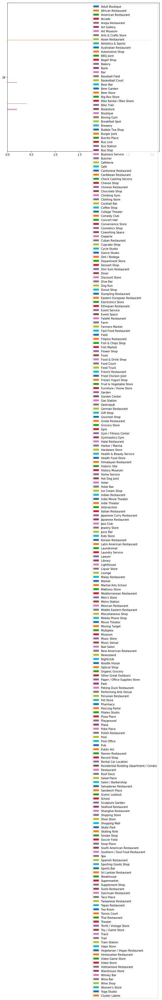

In [47]:
df_3 = nyc_venues_healthcare_grouped_clustering[nyc_venues_healthcare_grouped_clustering['Cluster Labels'] == 3]
df_3.plot.barh(figsize=(10, 10))

In [48]:
#cluster 4
nyc_merged.loc[nyc_merged['Cluster Labels'] == 4, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Ida G. Israel Community Health Center,11224.0,4,Pizza Place,Smoke Shop,Fast Food Restaurant,Deli / Bodega,Gas Station,Fried Chicken Joint,Cosmetics Shop,Pharmacy,Liquor Store,Bakery
6,Queens Hospital Center,11432.0,4,Pizza Place,Ice Cream Shop,Chinese Restaurant,Bakery,Filipino Restaurant,Bus Line,Fast Food Restaurant,Nail Salon,Coffee Shop,Sushi Restaurant
9,Junction Boulevard Child Health Clinic,11372.0,4,Fast Food Restaurant,Pizza Place,Bank,South American Restaurant,Gas Station,Pharmacy,Donut Shop,Chinese Restaurant,Salvadoran Restaurant,Sandwich Place
13,Metropolitan Hospital Center,10029.0,4,Pizza Place,Coffee Shop,Fast Food Restaurant,Thai Restaurant,Pharmacy,Bank,Gym,Chinese Restaurant,Cocktail Bar,Donut Shop
14,Bushwick Communicare,11221.0,4,Deli / Bodega,Café,Vape Store,Frozen Yogurt Shop,Supermarket,Fast Food Restaurant,Cocktail Bar,Coffee Shop,Latin American Restaurant,Restaurant
18,North Central Bronx Hospital,10467.0,4,Mexican Restaurant,Donut Shop,Pizza Place,Deli / Bodega,Spanish Restaurant,Park,Fast Food Restaurant,Mobile Phone Shop,Caribbean Restaurant,Library
23,Corona Child Health Clinic,11368.0,4,Pizza Place,Sandwich Place,Supermarket,Mexican Restaurant,Convenience Store,Latin American Restaurant,Donut Shop,Restaurant,Bakery,Park
25,Springfield Gardens Medical Center,11413.0,4,Caribbean Restaurant,Pizza Place,Mobile Phone Shop,Fried Chicken Joint,New American Restaurant,Sandwich Place,Fast Food Restaurant,Donut Shop,Supermarket,Pharmacy
27,Morrisania Diagnostic & Treatment Center,10452.0,4,Pizza Place,Chinese Restaurant,Pharmacy,Fried Chicken Joint,Latin American Restaurant,Sandwich Place,Supermarket,Fast Food Restaurant,Mobile Phone Shop,Grocery Store
33,Kings County Hospital Center,11203.0,4,Deli / Bodega,Pharmacy,Sandwich Place,Garden Center,Rental Car Location,Donut Shop,Coffee Shop,Other Great Outdoors,Chinese Restaurant,Check Cashing Service


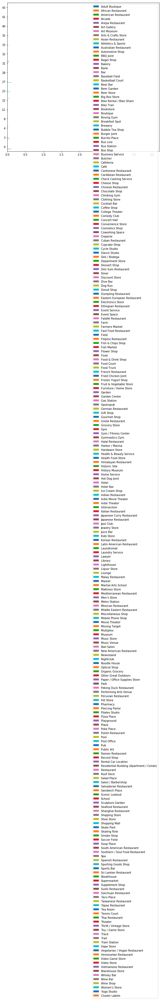

In [49]:
df_4 = nyc_venues_healthcare_grouped_clustering[nyc_venues_healthcare_grouped_clustering['Cluster Labels'] == 4]
df_4.plot.barh(figsize=(10, 10))

In [60]:
dff1=nyc_merged.loc[nyc_merged['Cluster Labels'] == 4, nyc_merged.columns[[1] + list(range(5, nyc_merged.shape[1]))]]
dff2=dff1[dff1.isin(['Pharmacy'])].dropna(how='all')
dff2

,facility_name,postcode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN
13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN,NaN
25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy
27,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN
50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy,NaN,NaN,NaN,NaN,NaN
66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pharmacy


In [65]:
dff=df2.loc[[0,9,13,25,27,33,35,40,50,66,69,77],['borough','facility_name','latitude','longitude']]
dff

,borough,facility_name,latitude,longitude
0,Brooklyn,Ida G. Israel Community Health Center,40.578468,-73.989614
9,Queens,Junction Boulevard Child Health Clinic,40.754179,-73.872231
13,Manhattan,Metropolitan Hospital Center,40.784557,-73.943780
25,Queens,Springfield Gardens Medical Center,40.678997,-73.754077
27,Bronx,Morrisania Diagnostic & Treatment Center,40.835957,-73.919986
33,Brooklyn,Kings County Hospital Center,40.655762,-73.944580
35,Brooklyn,Kings County Hospital Center,40.655762,-73.944580
40,Manhattan,Dyckman Clinica De Las Americas,40.861640,-73.924590
50,Manhattan,Metropolitan Hospital Center,40.784557,-73.943780
66,Bronx,Health Center at Tremont,40.844083,-73.894482


In [64]:
dff.groupby('borough').count()


,facility_name
borough,
Bronx,3
Brooklyn,3
Manhattan,4
Queens,2


In [ ]:
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, facility in zip(dff['latitude'], dff['longitude'], dff['borough'], dff['facility_name']):
    label = '{}, {}'.format(facility, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

in conclusion 
we descided being near to location of the patient and the compatitors is the keypoint of succses and fast growth for the new pharmacy.
we chose the list of all health facilities and hospitals in New York City and clusterd them in to 5 clusters as expressed from Elbow plot.   
cluster 0 :  no pharmacies but has shopping options and cafes around the areas of the health center ,but no compatitors arround it needs location analysis and feasibility study.. 
cluster 1 :  out door activites areas \ residential areas clasic option for new community pharmacy location which basicly focus on regular patients and has slower rate of growth   
cluster 2 :  expats residential areas \ asian minorities residential areas .. not good option as we foucus on higher income population areas  
cluster 3 :farmer market and supermarket \ household facilities ..clasic option for new community pharmacy as it will assure the foot flow to the store without too much effort to advertise the location. but no compatitors nearby the health centers  
cluster 4 : it is the idial areas to open new pharmacy as the are many factors to grantee the foot flow like the household and personal shopping facilities, varaitey of resturants and cafes, gym and the most important is the great availability of the compatitor pharmacies arround the health centers 